In [165]:
!pip install -qqq evaluate jiwer

In [181]:
!pip freeze

a2a-sdk==0.3.26
absl-py==1.4.0
accelerate==1.13.0
access==1.1.10.post3
affine==2.4.0
aiofiles==22.1.0
aiohappyeyeballs==2.6.1
aiohttp==3.13.5
aiosignal==1.4.0
aiosqlite==0.22.1
alabaster==1.0.0
albucore==0.0.24
albumentations==2.0.8
ale-py==0.11.2
alembic==1.18.4
altair==5.5.0
annotated-doc==0.0.4
annotated-types==0.7.0
antlr4-python3-runtime==4.9.3
anyio==4.13.0
anywidget==0.9.21
apsw==3.53.0.0
apswutils==0.1.2
argon2-cffi==25.1.0
argon2-cffi-bindings==25.1.0
args==0.1.0
array_record==0.8.3
arrow==1.4.0
arviz==0.22.0
asn1crypto==1.5.1
astropy==7.2.0
astropy-iers-data==0.2026.4.20.0.58.15
asttokens==3.0.1
astunparse==1.6.3
atpublic==5.1
attrs==26.1.0
audioread==3.1.0
Authlib==1.6.11
autograd==1.8.0
babel==2.18.0
backcall==0.2.0
bayesian-optimization==3.3.0
beartype==0.22.9
beautifulsoup4==4.13.5
betterproto==2.0.0b6
bigframes==2.39.0
bigquery-magics==0.14.0
black==26.5.1
blake3==1.0.9
bleach==6.3.0
blinker==1.9.0
blis==1.3.3
blobfile==3.2.0
blosc2==4.1.2
bokeh==3.8.2
Boruta==0.4.3
boto

In [166]:
import os
from urllib.request import urlretrieve
import tarfile

def download_and_unzip(url, save_path):
    print(f"Downloading and extracting assets....", end="")
    
    # Downloading the file using urllib package.
    urlretrieve(url, save_path)
    
    try:
        # Extracting .tar.gz file using the tarfile package.
        with tarfile.open(save_path, "r:gz") as tar:
            # Extract tar file contents in the same directory.
            tar.extractall(path=os.path.split(save_path)[0])
            
        print("Done")
        
    except Exception as e:
        print("\nInvalid file or extraction failed.", e)

In [168]:
URL = r"https://cvit.iiit.ac.in/images/Projects/wordlevel-Indicscripts/IIIT-HW-Hindi_v1.tar.gz"
asset_zip_path = os.path.join(os.getcwd(), "scut_data.zip")
 
# Download if asset ZIP does not exist.
if not os.path.exists(asset_zip_path):
    download_and_unzip(URL, asset_zip_path)

In [ ]:
save_path = "/kaggle/working/HindiSeg.tar.gz"

print(f"Extracting images...", end="")

with tarfile.open(save_path, "r:gz") as tar:
    # Extract tar file contents in the same directory.
    tar.extractall(path=os.path.split(save_path)[0])

print("Done")

In [ ]:
# !rm -rf "/kaggle/working/scut_data.zip" "/kaggle/working/HindiSeg.tar.gz"

In [169]:
!df -h

Filesystem        Size  Used Avail Use% Mounted on
overlay           7.9T  6.9T 1019G  88% /
tmpfs              64M     0   64M   0% /dev
shm                14G  4.0K   14G   1% /dev/shm
/dev/loop1         20G  4.1G   16G  21% /kaggle/lib
/dev/sda1         122G   38G   84G  32% /opt/bin
/dev/mapper/snap  7.9T  6.9T 1019G  88% /etc/hosts
tmpfs              16G     0   16G   0% /proc/acpi
tmpfs              16G     0   16G   0% /proc/scsi
tmpfs              16G     0   16G   0% /sys/firmware


In [ ]:
%%writefile train.py

import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset
from PIL import Image
from transformers import RobertaTokenizer, TrOCRProcessor
from transformers import ViTImageProcessor, AutoImageProcessor

# ImportError: cannot import name 'ViTFeatureExtractor' from 'transformers'
# from transformers import ViTFeatureExtractor

from transformers import VisionEncoderDecoderModel
from transformers import TrOCRProcessor
from transformers import Seq2SeqTrainer, Seq2SeqTrainingArguments
from transformers import default_data_collator
# from datasets import load_metric
import evaluate
os.environ["WANDB_DISABLED"] = "true"
# torch.cuda.empty_cache()

def seed_everything(seed_value):
    np.random.seed(seed_value)
    torch.manual_seed(seed_value)
    torch.cuda.manual_seed_all(seed_value)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
 
seed_everything(42)

# directory and file paths
train_text_file = "/kaggle/working/train.txt"
test_text_file = "/kaggle/working/test.txt"
val_text_file = "/kaggle/working/val.txt"
root_dir = "/kaggle/working/"

def dataset_generator(data_path):
    with open(data_path) as f:
        dataset = f.readlines()
    # counter = 0

    dataset_list = []
    for i in range(len(dataset)):
        # if counter > 30000:
        #     break
        image_id = dataset[i].split("\n")[0].split(' ')[0].strip()
        # vocab_id = int(dataset[i].split(",")[1].strip())
        text = dataset[i].split("\n")[0].split(' ')[1].strip()
        row = [image_id, text]
        dataset_list.append(row)
        # counter += 1

    dataset_df = pd.DataFrame(dataset_list, columns=['file_name', 'text'])
    # dataset_df.head()
    return dataset_df
    
train_df = dataset_generator(train_text_file)
test_df = dataset_generator(test_text_file)
val_df = dataset_generator(val_text_file)

print(f"Train, Test & Val shape: {train_df.shape, test_df.shape, val_df.shape}")

class IAMDataset(Dataset):
    def __init__(self, root_dir, df, processor, max_target_length=128):
        self.root_dir = root_dir
        self.df = df
        self.processor = processor
        self.max_target_length = max_target_length

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        # get file name + text 
        file_name = self.df['file_name'][idx]
        text = self.df['text'][idx]
        # prepare image (i.e. resize + normalize)
        image = Image.open(self.root_dir + file_name).convert("RGB")
        pixel_values = self.processor(image, return_tensors="pt").pixel_values
        # add labels (input_ids) by encoding the text
        labels = self.processor.tokenizer(text, 
                                          padding="max_length", 
                                          max_length=self.max_target_length).input_ids
        # important: make sure that PAD tokens are ignored by the loss function
        labels = [label if label != self.processor.tokenizer.pad_token_id else -100 for label in labels]

        encoding = {"pixel_values": pixel_values.squeeze(), "labels": torch.tensor(labels)}
        # print(encoding)
        return encoding


encode = 'google/vit-base-patch16-224-in21k'
decode = 'flax-community/roberta-hindi'


# TypeError: Received a str for argument image_processor, but a ImageProcessingMixin was expected.
# feature_extractor = ViTImageProcessor.from_pretrained(encode)

# feature_extractor = AutoImageProcessor.from_pretrained(encode)
# tokenizer = RobertaTokenizer.from_pretrained(decode)

# TypeError: Received a NoneType for argument image_processor, but a ImageProcessingMixin was expected.
# processor = TrOCRProcessor(feature_extractor=feature_extractor, tokenizer=tokenizer)
# processor = TrOCRProcessor(encode, tokenizer=tokenizer)

# Above Errors Fixed
image_processor = AutoImageProcessor.from_pretrained(encode)
tokenizer = RobertaTokenizer.from_pretrained(decode)

processor = TrOCRProcessor(image_processor=image_processor, tokenizer=tokenizer)

# Limiting the Samples
# Sample 1000 rows randomly from train, and a proportional amount (e.g., 200) from test/val
train_df_sampled = train_df.sample(n=10000, random_state=42).reset_index(drop=True)
test_df_sampled = test_df.sample(n=500, random_state=42).reset_index(drop=True)
val_df_sampled = val_df.sample(n=500, random_state=42).reset_index(drop=True)

# Always verify the new shapes
print(f"Sampled shapes: {train_df_sampled.shape, test_df_sampled.shape, val_df_sampled.shape}")

# Pass the sampled DataFrames to your Dataset class
train_dataset = IAMDataset(root_dir=root_dir, df=train_df_sampled, processor=processor)
eval_dataset = IAMDataset(root_dir=root_dir, df=test_df_sampled, processor=processor)

# Default
# train_dataset = IAMDataset(root_dir=root_dir,
#                            df=train_df,
#                            processor=processor)
# eval_dataset = IAMDataset(root_dir=root_dir,
#                            df=test_df,
#                            processor=processor)

model = VisionEncoderDecoderModel.from_encoder_decoder_pretrained(encode, decode)

model.config.decoder_start_token_id = processor.tokenizer.cls_token_id
model.config.pad_token_id = processor.tokenizer.pad_token_id
print(f"processor.tokenizer.pad_token_id: {processor.tokenizer.pad_token_id}")
model.config.vocab_size = model.config.decoder.vocab_size
# config_decoder.is_decoder = True
# config_decoder.add_cross_attention = True

# ValueError: You have modified the pretrained model configuration to control generation We detected the following values set - 
# {'max_length': 64, 'early_stopping': True, 'num_beams': 4, 'length_penalty': 2.0, 'no_repeat_ngram_size': 3}. 
# This strategy to control generation is not supported anymore. Please use and modify `model.generation_config`

# set beam search parameters
# model.config.eos_token_id = processor.tokenizer.sep_token_id
# model.config.max_length = 64
# model.config.early_stopping = True
# model.config.no_repeat_ngram_size = 3
# model.config.length_penalty = 2.0
# model.config.num_beams = 4

# model.generation_config.eos_token_id = processor.tokenizer.sep_token_id
# model.generation_config.max_length = 64
# model.generation_config.early_stopping = True
# model.generation_config.no_repeat_ngram_size = 3
# model.generation_config.length_penalty = 2.0
# model.generation_config.num_beams = 4

from transformers import GenerationConfig

# 1. Access or initialize the generation config
generation_config = GenerationConfig.from_model_config(model.config)

# 2. Set your beam search parameters
generation_config.eos_token_id = processor.tokenizer.sep_token_id
generation_config.max_length = 64
generation_config.early_stopping = True
generation_config.no_repeat_ngram_size = 3
generation_config.length_penalty = 2.0
generation_config.num_beams = 4

# 3. Assign it back to the model
model.generation_config = generation_config

print("Number of training examples:", len(train_dataset))
print("Number of validation examples:", len(eval_dataset))

# ImportError: cannot import name 'load_metric' from 'datasets'
# cer_metric = load_metric("cer")
cer_metric = evaluate.load('cer')

def compute_metrics(pred):
    labels_ids = pred.label_ids
    pred_ids = pred.predictions

    pred_str = processor.batch_decode(pred_ids, skip_special_tokens=True)
    labels_ids[labels_ids == -100] = processor.tokenizer.pad_token_id
    label_str = processor.batch_decode(labels_ids, skip_special_tokens=True)

    cer = cer_metric.compute(predictions=pred_str, references=label_str)
    return {"cer": cer}


per_gpu_batch_size = 32

training_args = Seq2SeqTrainingArguments(
    predict_with_generate=True,
    eval_strategy="epoch",
    per_device_train_batch_size=per_gpu_batch_size,
    per_device_eval_batch_size=per_gpu_batch_size,
    fp16=True,
    # Changed to Root dir, only for Kaggle Space Issue
    output_dir="../checkpoints/",
    logging_strategy='epoch',
    save_strategy='epoch',
    save_total_limit=5,
    report_to='tensorboard',
    num_train_epochs=10,
    # output_dir="./checkpoints/",
    # logging_steps=2,
    # save_steps=2000,
    # eval_steps=100, 
    ddp_find_unused_parameters=True, # Add this for safer distributed execution

    # safetensors_rust.SafetensorError: Error while serializing: I/O error: No space left on device (os error 28)
    save_only_model=True
)

# instantiate trainer
trainer = Seq2SeqTrainer(
    model=model,
    # tokenizer=processor.feature_extractor,
    processing_class=processor.image_processor,
    args=training_args,
    compute_metrics=compute_metrics,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset,
    data_collator=default_data_collator,
)

trainer.train()

os.makedirs("../model/", exist_ok=True)

# Changed to Root dir, only for Kaggle Space Issue
model.save_pretrained("../model/")

In [ ]:
!accelerate launch --multi_gpu train.py

In [ ]:
!ls -l ../checkpoints

In [172]:
%%writefile test.py

from transformers import VisionEncoderDecoderModel
from transformers import RobertaTokenizer, TrOCRProcessor
from transformers import VisionEncoderDecoderModel
from transformers import TrOCRProcessor
from PIL import Image
import matplotlib.pyplot as plt

from transformers import ViTImageProcessor, AutoImageProcessor

encode = 'google/vit-base-patch16-224-in21k'
decode = 'flax-community/roberta-hindi'

# feature_extractor=ViTFeatureExtractor.from_pretrained(encode)
# tokenizer = RobertaTokenizer.from_pretrained(decode)
# processor = TrOCRProcessor(feature_extractor=feature_extractor, tokenizer=tokenizer)

# For transformers ==5.0.0
image_processor = AutoImageProcessor.from_pretrained(encode)
tokenizer = RobertaTokenizer.from_pretrained(decode)
processor = TrOCRProcessor(image_processor=image_processor, tokenizer=tokenizer)


# checkpoint_or_model_folder = "../checkpoints/checkpoint-10"
checkpoint_or_model_folder = "model"
model = VisionEncoderDecoderModel.from_pretrained(checkpoint_or_model_folder)

def preview(image_path):
    image = Image.open(image_path).convert("RGB")
    pixel_values = processor(image, return_tensors="pt").pixel_values
    generated_ids = model.generate(pixel_values)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    plt.imshow(image)
    print(f"\n\n {generated_text}")
    
image_path = "/kaggle/working/HindiSeg/test/11/1/1.jpg"
preview(image_path=image_path)

Overwriting test.py


In [173]:
!python test.py

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Loading weights: 100%|█| 524/524 [00:00<00:00, 1631.78it/s, Materializing param=
The tied weights mapping and config for this model specifies to tie decoder.roberta.embeddings.word_embeddings.weight to decoder.lm_head.decoder.weight, but both are present in the checkpoints, so we will NOT tie them. You should update the config with `tie_word_embeddings=False` to silence this warning
The tied weights mapping and config for this model specifies to tie decoder.lm_head.bias to decoder.lm_head.decoder.bias, but both are present in the checkpoints, so we will NOT tie them. You should update the config with `tie_word_embeddings=False` to silence this warning


 बैला


In [174]:
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset
from PIL import Image
from transformers import RobertaTokenizer, TrOCRProcessor
from transformers import ViTImageProcessor, AutoImageProcessor

# ImportError: cannot import name 'ViTFeatureExtractor' from 'transformers'
# from transformers import ViTFeatureExtractor

from transformers import VisionEncoderDecoderModel
from transformers import TrOCRProcessor
from transformers import Seq2SeqTrainer, Seq2SeqTrainingArguments
from transformers import default_data_collator
# from datasets import load_metric
import evaluate
os.environ["WANDB_DISABLED"] = "true"

In [175]:
import glob
import torch
from tqdm import tqdm
from PIL import Image
import matplotlib.pyplot as plt

from transformers import VisionEncoderDecoderModel
from transformers import RobertaTokenizer, TrOCRProcessor
from transformers import VisionEncoderDecoderModel
from transformers import TrOCRProcessor
from transformers import ViTImageProcessor, AutoImageProcessor

encode = 'google/vit-base-patch16-224-in21k'
decode = 'flax-community/roberta-hindi'

# For transformers ==5.0.0
image_processor = AutoImageProcessor.from_pretrained(encode)
tokenizer = RobertaTokenizer.from_pretrained(decode)
processor = TrOCRProcessor(image_processor=image_processor, tokenizer=tokenizer)

checkpoint_or_model_folder = "model"
model = VisionEncoderDecoderModel.from_pretrained(checkpoint_or_model_folder)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Loading weights:   0%|          | 0/524 [00:00<?, ?it/s]

The tied weights mapping and config for this model specifies to tie decoder.roberta.embeddings.word_embeddings.weight to decoder.lm_head.decoder.weight, but both are present in the checkpoints, so we will NOT tie them. You should update the config with `tie_word_embeddings=False` to silence this warning
The tied weights mapping and config for this model specifies to tie decoder.lm_head.bias to decoder.lm_head.decoder.bias, but both are present in the checkpoints, so we will NOT tie them. You should update the config with `tie_word_embeddings=False` to silence this warning


VisionEncoderDecoderModel(
  (encoder): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=768, out_features=3072, bias=True)
            (inte

In [176]:
import evaluate

def read_and_show(image_path):
    """
    :param image_path: String, path to the input image.
 
 
    Returns:
        image: PIL Image.
    """
    image = Image.open(image_path).convert('RGB')
    return image


cer_metric = evaluate.load('cer')
 
def compute_cer(pred):
    labels_ids = pred.label_ids
    pred_ids = pred.predictions
 
    pred_str = processor.batch_decode(pred_ids, skip_special_tokens=True)
    labels_ids[labels_ids == -100] = processor.tokenizer.pad_token_id
    label_str = processor.batch_decode(labels_ids, skip_special_tokens=True)
  
    cer = cer_metric.compute(predictions=pred_str, references=label_str)
  
    return {"cer": cer}

# Load the word error rate metric alongside your CER metric
wer_metric = evaluate.load('wer')

def compute_wer(predictions, references):
    """
    Computes Word Error Rate (WER) for a batch of predictions and references.
    """
    if not references:
        return 0.0
    return wer_metric.compute(predictions=predictions, references=references)
    

def ocr(image, processor, model):
    """
    :param image: PIL Image.
    :param processor: Huggingface OCR processor.
    :param model: Huggingface OCR model.
 
 
    Returns:
        generated_text: the OCR'd text string.
    """
    # We can directly perform OCR on cropped images.
    pixel_values = processor(image, return_tensors='pt').pixel_values.to(device)
    generated_ids = model.generate(pixel_values)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return generated_text

root_dir = "/kaggle/working/"

def eval_new_data(data_path=os.path.join(root_dir, 'HindiSeg', '**','*.jpg'), num_samples=5):
    image_paths = glob.glob(data_path, recursive=True)
    for i, image_path in tqdm(enumerate(image_paths), total=len(image_paths)):
        if i == num_samples:
            break
        image = read_and_show(image_path)
        text = ocr(image, processor, model)

        # UserWarning: Glyph 2340 (\N{DEVANAGARI LETTER TA}) missing from font(s) DejaVu Sans
        plt.rcParams['font.sans-serif'] = ['Nirmala UI', 'DejaVu Sans']

        print(f"\n{text}")
        plt.figure(figsize=(7, 4))
        plt.imshow(image)
        plt.title(text)
        plt.axis('off')
        plt.show()


def eval_new_data_version_2(data_path=os.path.join(root_dir, 'HindiSeg', '**', '*.jpg'), num_samples=5):
    image_paths = glob.glob(data_path, recursive=True)
    
    # Lists to store text for metric calculation
    all_predictions = []
    all_references = []
    
    for i, image_path in tqdm(enumerate(image_paths), total=len(image_paths)):
        if i == num_samples:
            break
            
        # 1. Generate text prediction
        image = read_and_show(image_path)
        predicted_text = ocr(image, processor, model)
        all_predictions.append(predicted_text)
        
        # 2. Extract ground truth text from the matching .txt file
        txt_path = os.path.splitext(image_path)[0] + ".txt"
        if os.path.exists(txt_path):
            with open(txt_path, 'r', encoding='utf-8') as f:
                reference_text = f.read().strip()
        else:
            reference_text = ""  # Fallback if text file is missing
        all_references.append(reference_text)
        
        # 3. Handle Matplotlib font configuration for Hindi characters
        plt.rcParams['font.sans-serif'] = ['Nirmala UI', 'FreeSans', 'Arial Unicode MS', 'DejaVu Sans']
        
        # 4. Display the comparison
        print(f"\n[True]: {reference_text}")
        print(f"[Pred]: {predicted_text}")
        
        plt.figure(figsize=(7, 4))
        plt.imshow(image)
        # plt.title(f"Pred: {predicted_text}")
        plt.axis('off')
        plt.show()
        
    # 5. Compute and print overall CER for the evaluated batch
    if all_references:
        batch_cer = cer_metric.compute(predictions=all_predictions, references=all_references)
        print(f"\n📊 Overall CER for {num_samples} samples: {batch_cer:.4f}")

In [177]:
# directory and file paths
train_text_file = "/kaggle/working/train.txt"
test_text_file = "/kaggle/working/test.txt"
val_text_file = "/kaggle/working/val.txt"
root_dir = "/kaggle/working/"

def dataset_generator(data_path):
    with open(data_path) as f:
        dataset = f.readlines()
    # counter = 0

    dataset_list = []
    for i in range(len(dataset)):
        # if counter > 30000:
        #     break
        image_id = dataset[i].split("\n")[0].split(' ')[0].strip()
        # vocab_id = int(dataset[i].split(",")[1].strip())
        text = dataset[i].split("\n")[0].split(' ')[1].strip()
        row = [image_id, text]
        dataset_list.append(row)
        # counter += 1

    dataset_df = pd.DataFrame(dataset_list, columns=['file_name', 'text'])
    # dataset_df.head()
    return dataset_df
    
# train_df = dataset_generator(train_text_file)
test_df = dataset_generator(test_text_file)
# val_df = dataset_generator(val_text_file)

# Limiting the Samples
# Sample 1000 rows randomly from train, and a proportional amount (e.g., 200) from test/val
# train_df_sampled = train_df.sample(n=100, random_state=42).reset_index(drop=True)
test_df_sampled = test_df.sample(n=500, random_state=42).reset_index(drop=True)
# val_df_sampled = val_df.sample(n=50, random_state=42).reset_index(drop=True)

In [178]:
test_df_sampled.head()

,file_name,text
0,HindiSeg/test/9/129/29.jpg,धनवाला।
1,HindiSeg/test/6/25/36.jpg,उपदेश
2,HindiSeg/test/6/36/30.jpg,उबालें
3,HindiSeg/test/6/19/12.jpg,फुरसतियाजी
4,HindiSeg/test/9/136/2.jpg,नवाज़


In [179]:
import evaluate

cer_metric = evaluate.load('cer') 
wer_metric = evaluate.load('wer')

def eval_new_data_with_df(df_sampled, root_dir="/kaggle/working/", num_samples=5):
    all_predictions = []
    all_references = []
    
    # Process up to your maximum requested limit safely
    limit = min(num_samples, len(df_sampled))
    
    for idx in tqdm(range(limit), total=limit):
        # 1. Fetch path and ground truth label straight from your DataFrame rows
        file_name = df_sampled['file_name'].iloc[idx]
        reference_text = df_sampled['text'].iloc[idx]
        
        # Build the exact absolute image location path
        image_path = os.path.join(root_dir, file_name)
        
        if not os.path.exists(image_path):
            print(f"⚠️ Warning: File missing at {image_path}")
            continue
            
        # 2. Execute inference pipeline
        image = read_and_show(image_path)
        predicted_text = ocr(image, processor, model)
        
        all_predictions.append(predicted_text)
        all_references.append(reference_text)
        
        # 3. Configure fonts for Indian Devanagari text display
        plt.rcParams['font.sans-serif'] = ['Nirmala UI', 'FreeSans', 'Arial Unicode MS', 'DejaVu Sans']
        
        # 4. Display comparisons dynamically
        print(f"\n[True]: {reference_text}")
        print(f"[Pred]: {predicted_text}")
        
        plt.figure(figsize=(7, 4))
        plt.imshow(image)
        # plt.title(f"Pred: {predicted_text}")
        plt.axis('off')
        plt.show()
        
    # 5. Execute your final metric evaluation batch run
    if all_references:
        batch_cer = cer_metric.compute(predictions=all_predictions, references=all_references)
        # Call the new word level error calculation function here
        batch_wer = wer_metric.compute(predictions=all_predictions, references=all_references)
        
        print("\n📊 --- Final Evaluation Report ---")
        print(f"Total Samples Processed: {limit}")
        print(f"Character Error Rate (CER): {batch_cer:.4f}")
        print(f"Word Error Rate (WER):      {batch_wer:.4f}")

  0%|          | 0/100 [00:00<?, ?it/s]


[True]: धनवाला।
[Pred]: घबराइए।


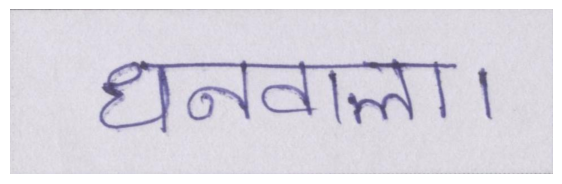

  1%|          | 1/100 [00:00<00:24,  4.03it/s]


[True]: उपदेश
[Pred]: उद्योक्षा


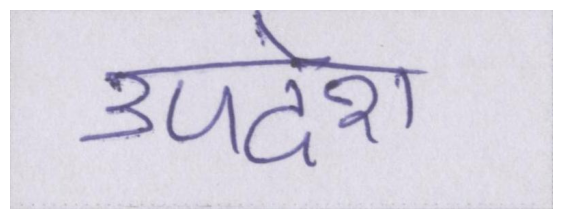

  2%|▏         | 2/100 [00:00<00:27,  3.59it/s]


[True]: उबालें
[Pred]: उबालों


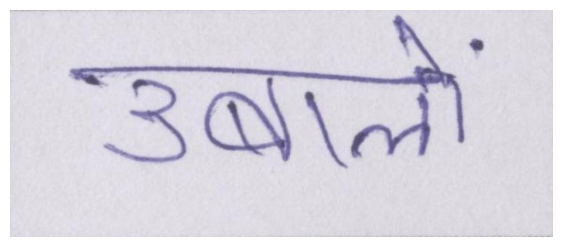

  3%|▎         | 3/100 [00:00<00:24,  3.94it/s]


[True]: फुरसतियाजी
[Pred]: प्रायूजिका


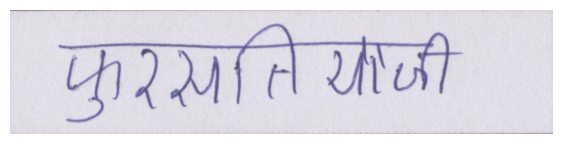

  4%|▍         | 4/100 [00:01<00:27,  3.47it/s]


[True]: नवाज़
[Pred]: ज़बाल


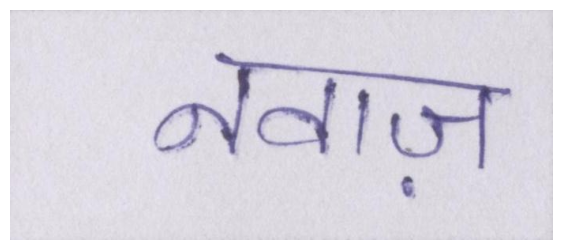

  5%|▌         | 5/100 [00:01<00:25,  3.75it/s]


[True]: फेंककर
[Pred]: फैक्टर


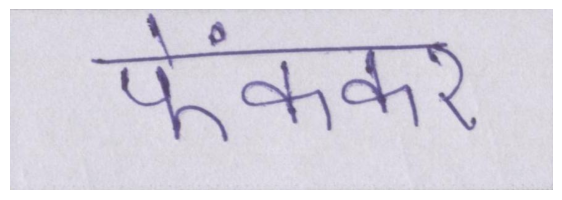

  6%|▌         | 6/100 [00:01<00:23,  3.98it/s]


[True]: भतीजे
[Pred]: पत्तियों


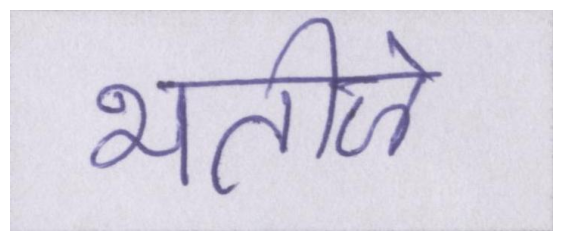

  7%|▋         | 7/100 [00:01<00:23,  3.95it/s]


[True]: नॉट
[Pred]: नॉट


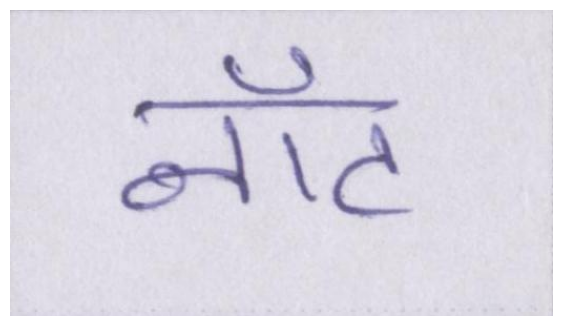

  8%|▊         | 8/100 [00:02<00:21,  4.30it/s]


[True]: तुम्हारी
[Pred]: गुल्बारी


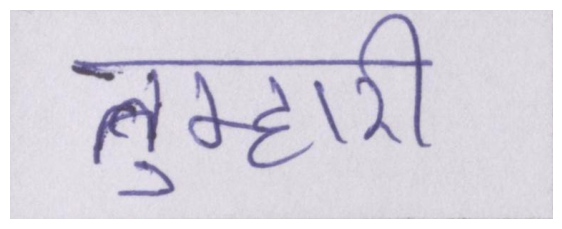

  9%|▉         | 9/100 [00:02<00:21,  4.14it/s]


[True]: पस्तौल
[Pred]: फ्सलाल


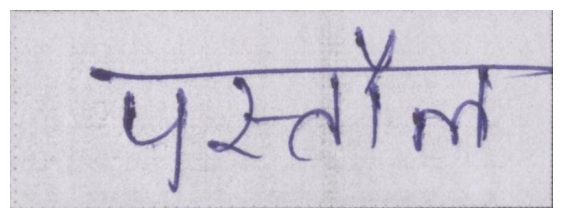

 10%|█         | 10/100 [00:02<00:21,  4.25it/s]


[True]: गोल-गोल
[Pred]: गोली-बार


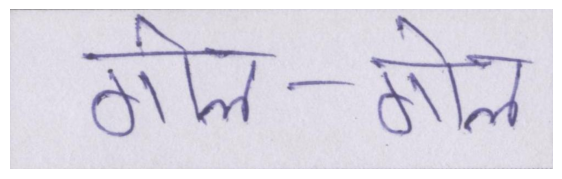

 11%|█         | 11/100 [00:02<00:21,  4.12it/s]


[True]: बीता
[Pred]: बीला


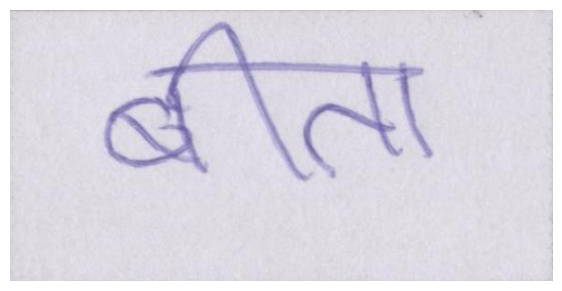

 12%|█▏        | 12/100 [00:02<00:20,  4.25it/s]


[True]: तलाविया
[Pred]: चालिया


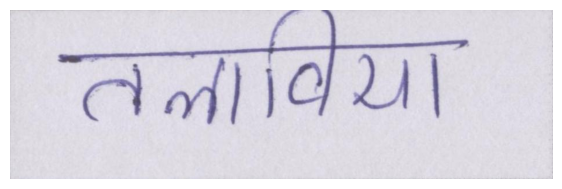

 13%|█▎        | 13/100 [00:03<00:21,  4.14it/s]


[True]: हूं।
[Pred]: हूँ।


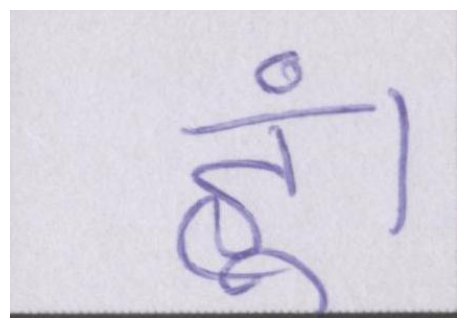

 14%|█▍        | 14/100 [00:03<00:19,  4.33it/s]


[True]: स्वरूप
[Pred]: सर्वप्रा


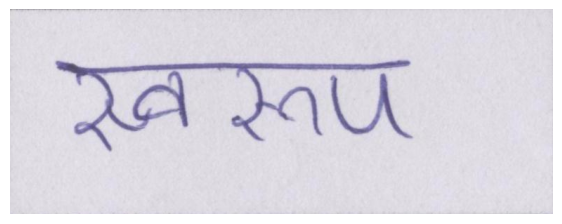

 15%|█▌        | 15/100 [00:03<00:19,  4.32it/s]


[True]: हैसियत
[Pred]: हैस्स-हिन्स


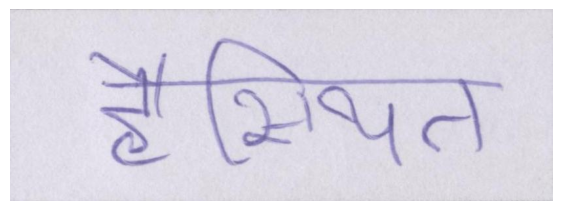

 16%|█▌        | 16/100 [00:03<00:21,  4.00it/s]


[True]: आफ
[Pred]: श्यालय


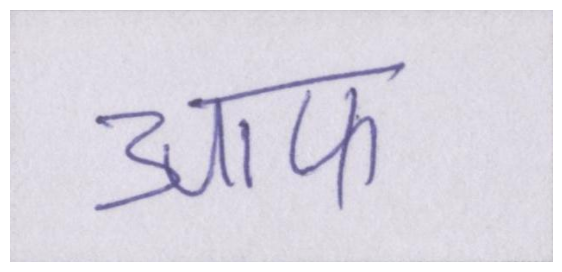

 17%|█▋        | 17/100 [00:04<00:20,  4.01it/s]


[True]: बुलाती
[Pred]: बुलाती


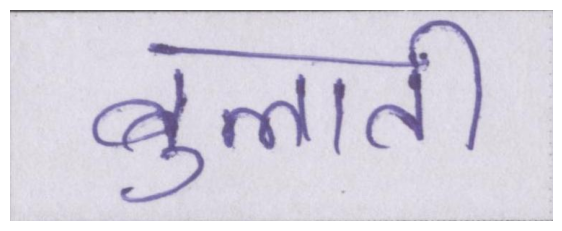

 18%|█▊        | 18/100 [00:04<00:20,  3.95it/s]


[True]: माघ
[Pred]: माह्य


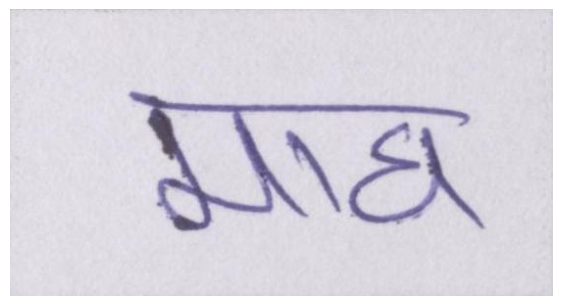

 19%|█▉        | 19/100 [00:04<00:19,  4.12it/s]


[True]: लाम
[Pred]: माल


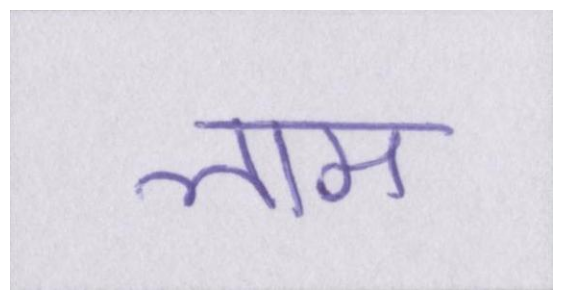

 20%|██        | 20/100 [00:04<00:18,  4.39it/s]


[True]: रियासत
[Pred]: सितार्स


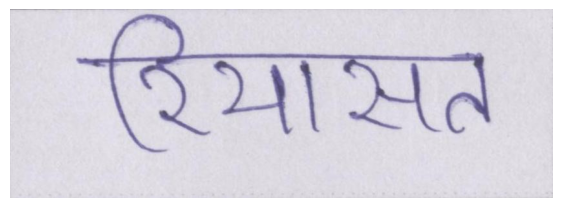

 21%|██        | 21/100 [00:05<00:18,  4.20it/s]


[True]: देखिएगा
[Pred]: दुखिया


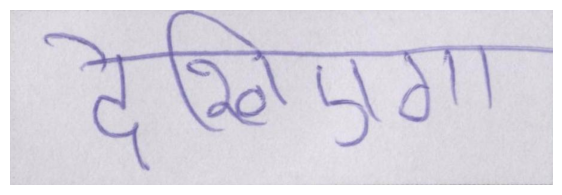

 22%|██▏       | 22/100 [00:05<00:18,  4.20it/s]


[True]: शैक्षिक
[Pred]: शौकिक


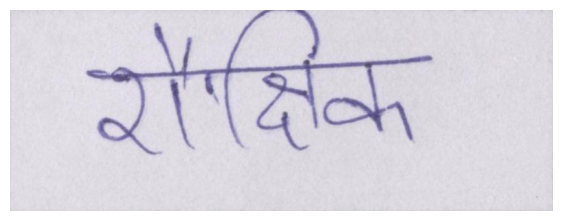

 23%|██▎       | 23/100 [00:05<00:18,  4.18it/s]


[True]: गोरे
[Pred]: गोरा


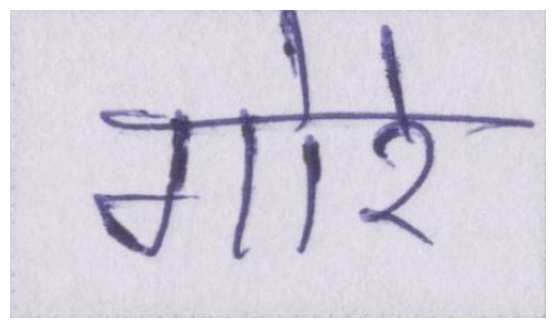

 24%|██▍       | 24/100 [00:05<00:17,  4.32it/s]


[True]: नाकारा
[Pred]: कालाबा


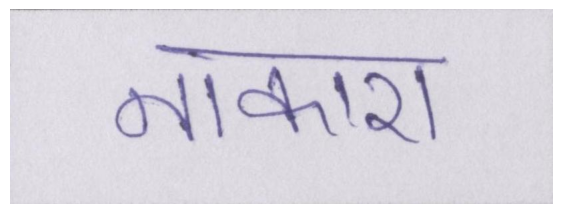

 25%|██▌       | 25/100 [00:06<00:17,  4.18it/s]


[True]: खयाल
[Pred]: रुखला


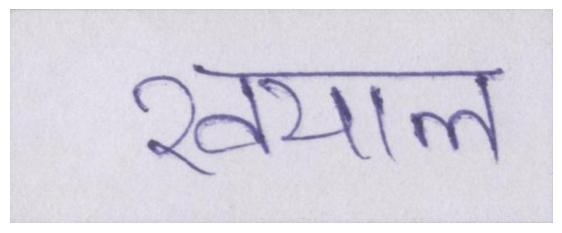

 26%|██▌       | 26/100 [00:06<00:17,  4.31it/s]


[True]: सदगुरू
[Pred]: इज्जतदार


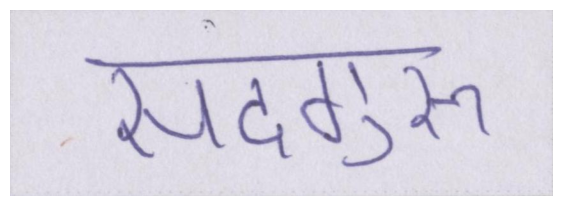

 27%|██▋       | 27/100 [00:06<00:16,  4.34it/s]


[True]: कोस
[Pred]: कोस्त


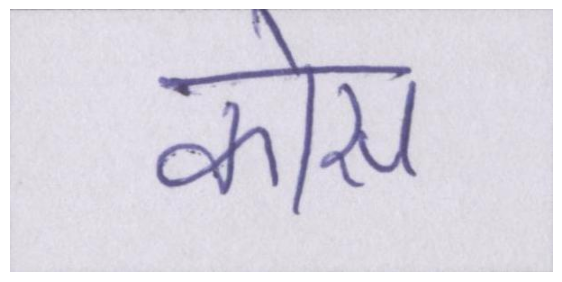

 28%|██▊       | 28/100 [00:06<00:16,  4.43it/s]


[True]: पाया
[Pred]: पाया


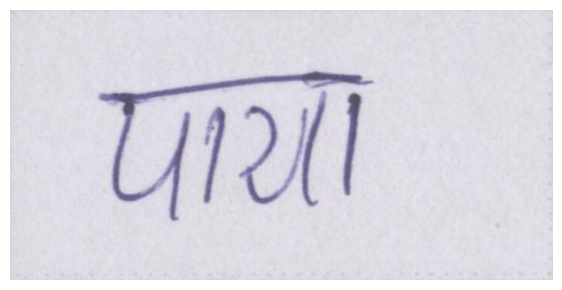

 29%|██▉       | 29/100 [00:06<00:16,  4.37it/s]


[True]: मंदी
[Pred]: संद्री


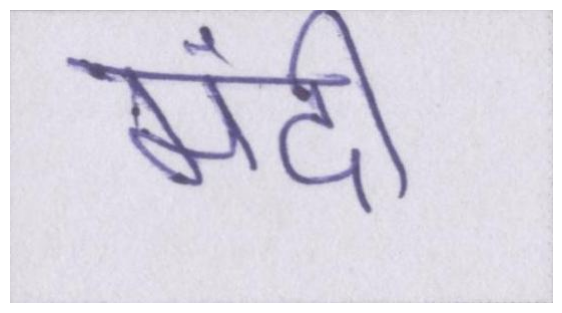

 30%|███       | 30/100 [00:07<00:16,  4.34it/s]


[True]: टसर
[Pred]: ज़रूर


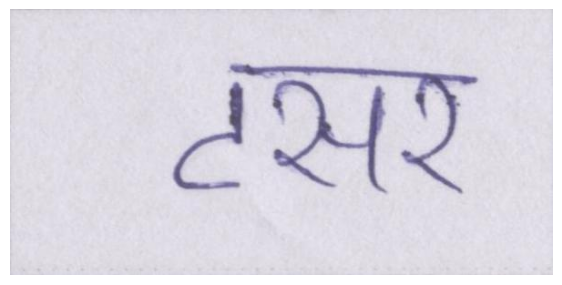

 31%|███       | 31/100 [00:07<00:14,  4.64it/s]


[True]: मेज
[Pred]: मेण्ड


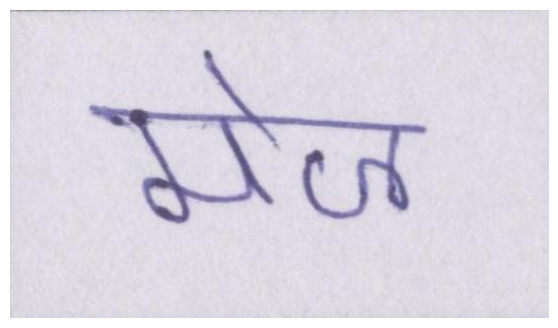

 32%|███▏      | 32/100 [00:07<00:14,  4.62it/s]


[True]: रोनाल्डो
[Pred]: गोरनाने


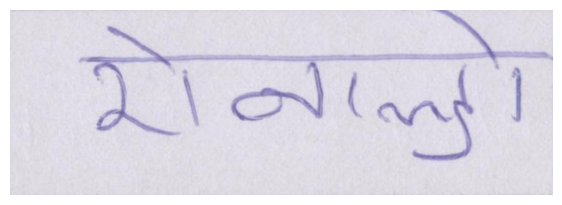

 33%|███▎      | 33/100 [00:07<00:14,  4.50it/s]


[True]: जानी
[Pred]: जानी


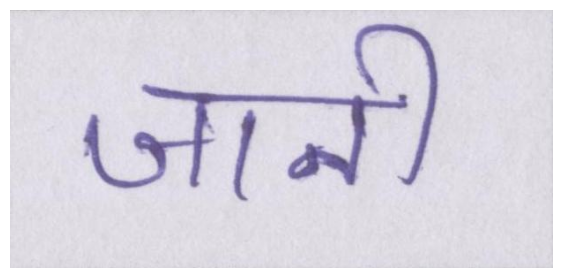

 34%|███▍      | 34/100 [00:08<00:15,  4.36it/s]


[True]: सक्रियता
[Pred]: स्क्रियता


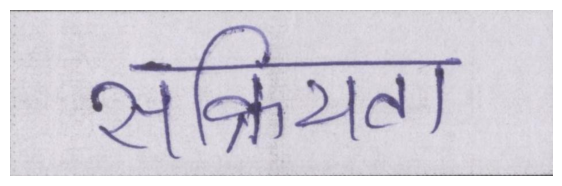

 35%|███▌      | 35/100 [00:08<00:15,  4.20it/s]


[True]: उठायी
[Pred]: घटायी


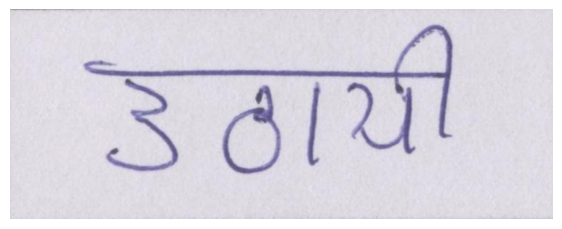

 36%|███▌      | 36/100 [00:08<00:14,  4.37it/s]


[True]: शुष्क
[Pred]: कुष्ठा


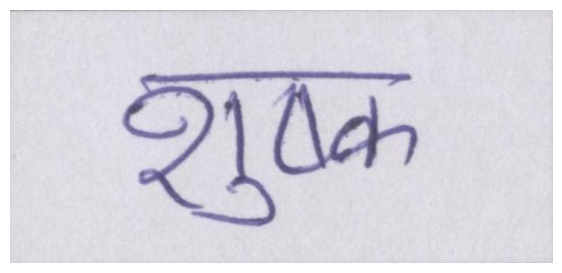

 37%|███▋      | 37/100 [00:08<00:14,  4.26it/s]


[True]: घोटालो
[Pred]: चोटता


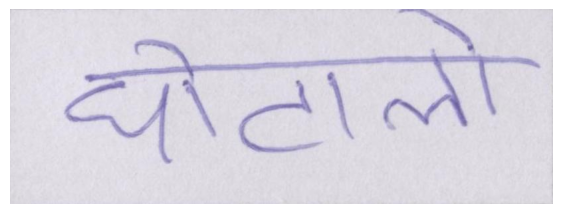

 38%|███▊      | 38/100 [00:09<00:14,  4.31it/s]


[True]: जादुई।
[Pred]: टाईडर


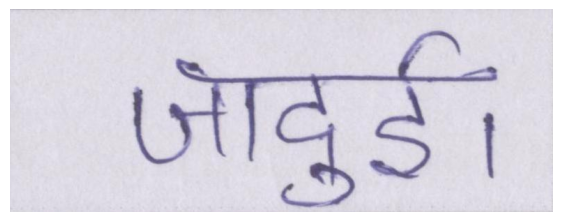

 39%|███▉      | 39/100 [00:09<00:13,  4.46it/s]


[True]: नवाज़
[Pred]: बनायें


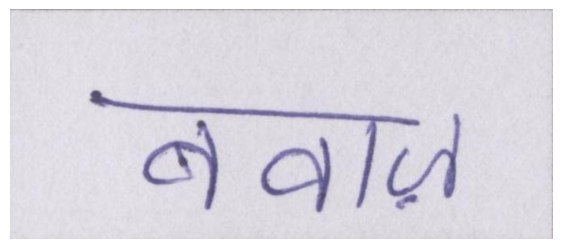

 40%|████      | 40/100 [00:09<00:13,  4.58it/s]


[True]: कागज़
[Pred]: कागज़


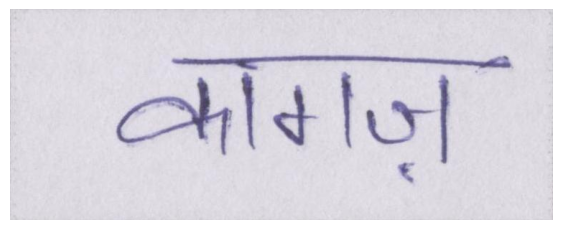

 41%|████      | 41/100 [00:09<00:12,  4.57it/s]


[True]: सम्बंधित
[Pred]: स्वामीनंस्ट


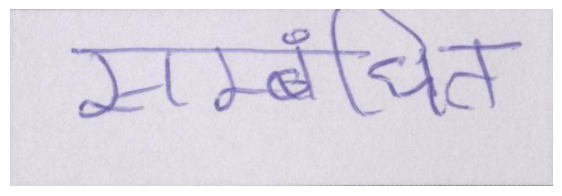

 42%|████▏     | 42/100 [00:09<00:14,  4.01it/s]


[True]: इंडो-ईरानी
[Pred]: हंस-हारी


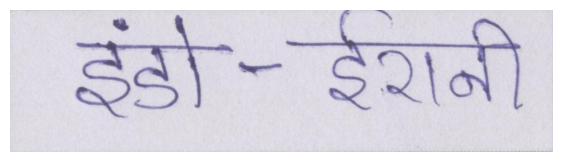

 43%|████▎     | 43/100 [00:10<00:14,  3.89it/s]


[True]: अंबेसडर
[Pred]: सेटगंडर्स


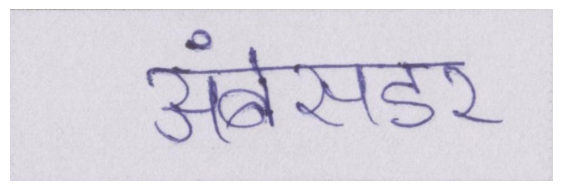

 44%|████▍     | 44/100 [00:10<00:14,  3.91it/s]


[True]: अनाज
[Pred]: आसन्य


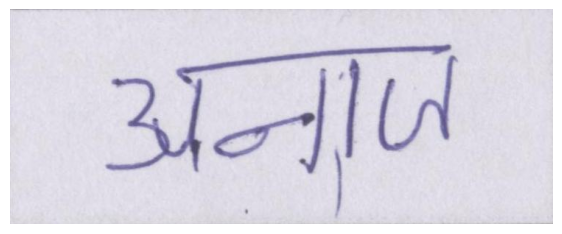

 45%|████▌     | 45/100 [00:10<00:13,  4.11it/s]


[True]: घन्टे
[Pred]: छुन्ने


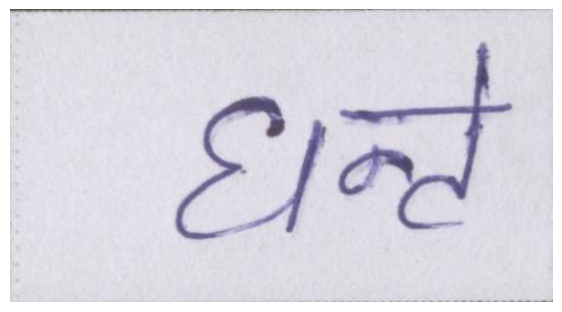

 46%|████▌     | 46/100 [00:10<00:13,  4.04it/s]


[True]: इंच
[Pred]: इंग


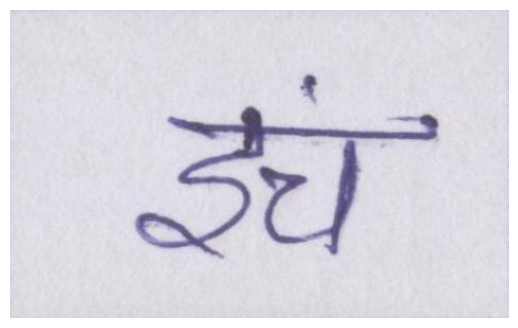

 47%|████▋     | 47/100 [00:11<00:12,  4.41it/s]


[True]: वेफ
[Pred]: केप


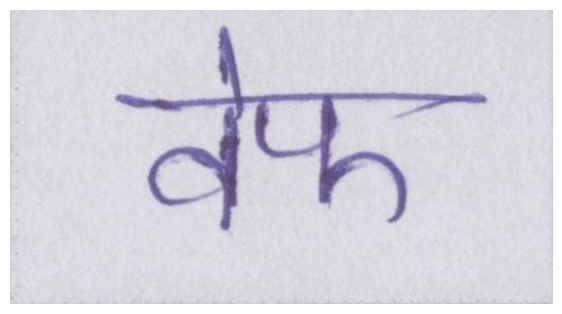

 48%|████▊     | 48/100 [00:11<00:11,  4.67it/s]


[True]: मुम्बई
[Pred]: मुनर्द्र


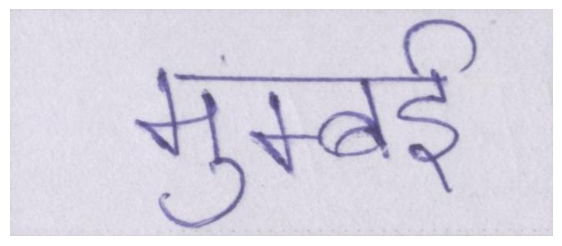

 49%|████▉     | 49/100 [00:11<00:11,  4.51it/s]


[True]: एनओसी
[Pred]: आरो-स्थे


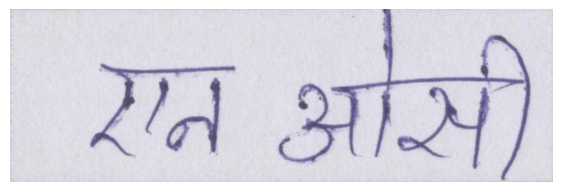

 50%|█████     | 50/100 [00:11<00:11,  4.45it/s]


[True]: घोड़े
[Pred]: छोड़े


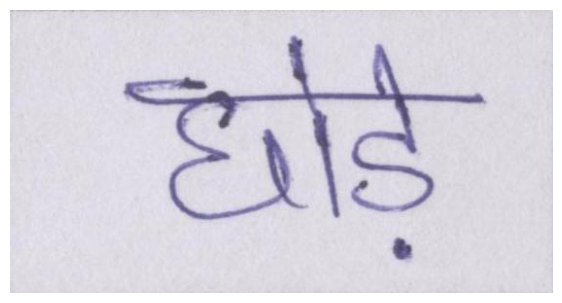

 51%|█████     | 51/100 [00:12<00:10,  4.61it/s]


[True]: खोलें।
[Pred]: खेला।


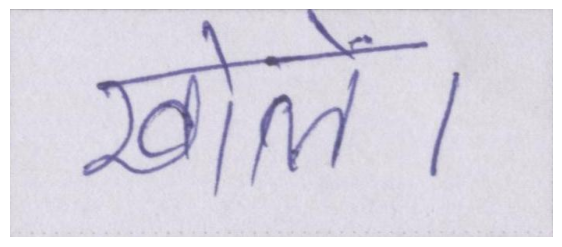

 52%|█████▏    | 52/100 [00:12<00:10,  4.44it/s]


[True]: क़व्वाली
[Pred]: जल्बाली


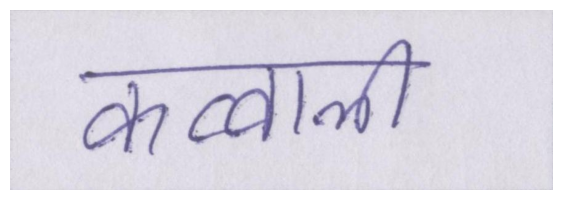

 53%|█████▎    | 53/100 [00:12<00:10,  4.30it/s]


[True]: पूछता
[Pred]: पूछता


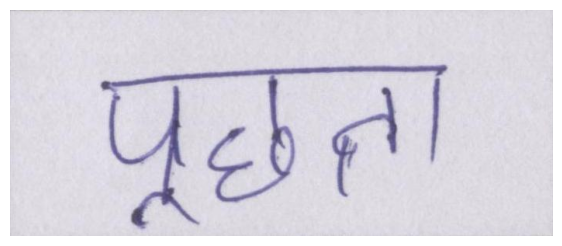

 54%|█████▍    | 54/100 [00:12<00:10,  4.26it/s]


[True]: फोटुएं
[Pred]: पुटकाये


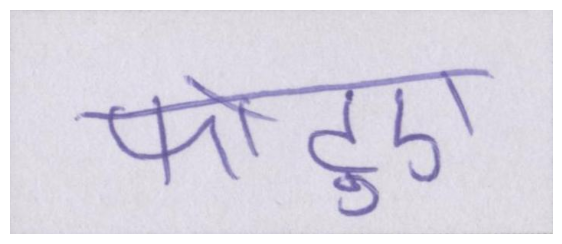

 55%|█████▌    | 55/100 [00:13<00:10,  4.22it/s]


[True]: गुज़रता
[Pred]: बढ़कर।


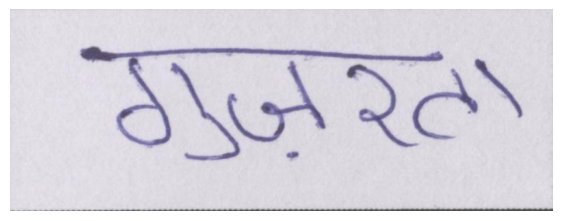

 56%|█████▌    | 56/100 [00:13<00:10,  4.39it/s]


[True]: देवपूजा
[Pred]: फेयरफ।


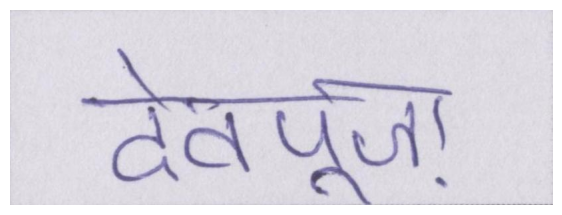

 57%|█████▋    | 57/100 [00:13<00:09,  4.42it/s]


[True]: कफ़न-दफन
[Pred]: कालू-बास


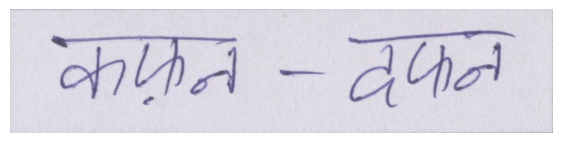

 58%|█████▊    | 58/100 [00:13<00:10,  4.06it/s]


[True]: एहसास
[Pred]: राइटर


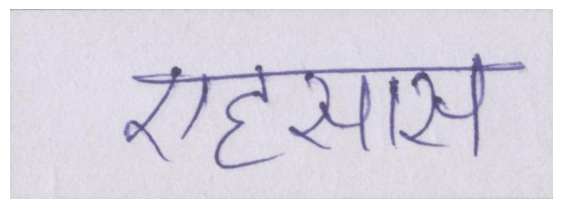

 59%|█████▉    | 59/100 [00:13<00:09,  4.25it/s]


[True]: फजीहत
[Pred]: प्रतीज्वल


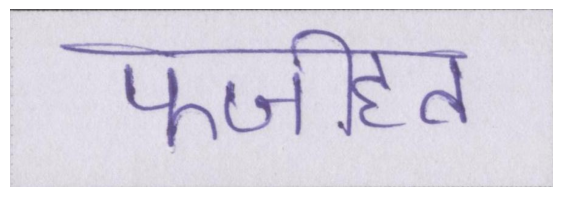

 60%|██████    | 60/100 [00:14<00:09,  4.27it/s]


[True]: लुईस
[Pred]: रुक्रेस


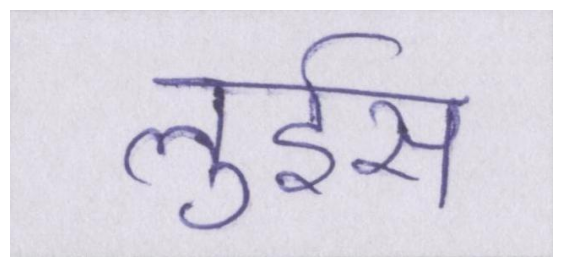

 61%|██████    | 61/100 [00:14<00:09,  4.14it/s]


[True]: ग्रामोफोन
[Pred]: प्रोग्रामको


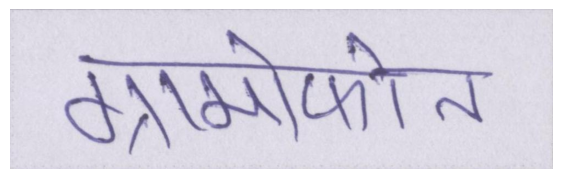

 62%|██████▏   | 62/100 [00:14<00:09,  3.89it/s]


[True]: संपन्नता
[Pred]: संत्रालय


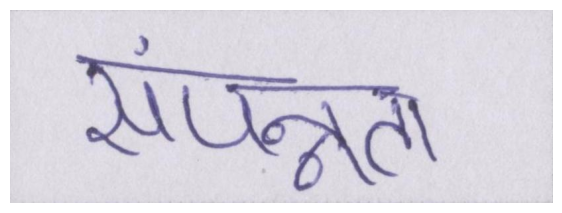

 63%|██████▎   | 63/100 [00:14<00:09,  3.92it/s]


[True]: सुरिंदर
[Pred]: स्टिंग्यूट


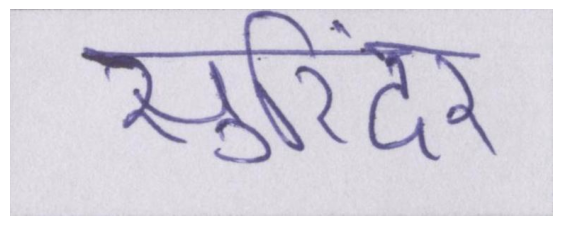

 64%|██████▍   | 64/100 [00:15<00:09,  3.90it/s]


[True]: दही
[Pred]: दुदी


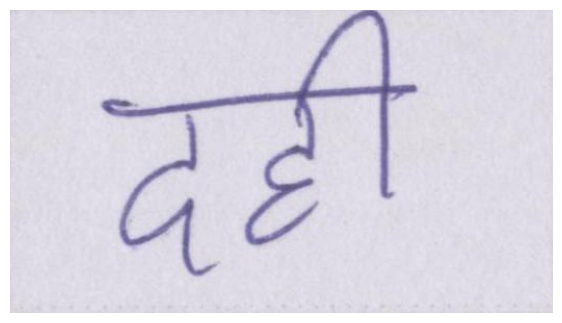

 65%|██████▌   | 65/100 [00:15<00:08,  4.02it/s]


[True]: भाजी
[Pred]: निर्मारी


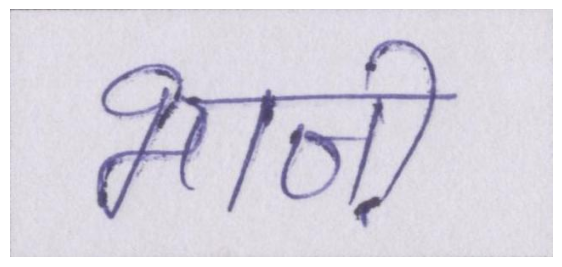

 66%|██████▌   | 66/100 [00:15<00:09,  3.75it/s]


[True]: बर्किघम
[Pred]: क्रामिश्र


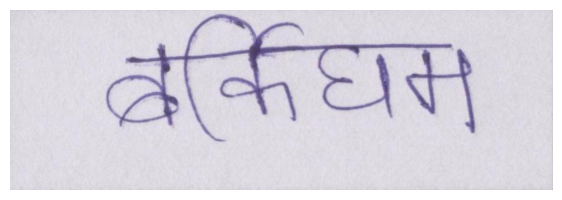

 67%|██████▋   | 67/100 [00:16<00:08,  3.73it/s]


[True]: मूर्छा
[Pred]: मर्दा


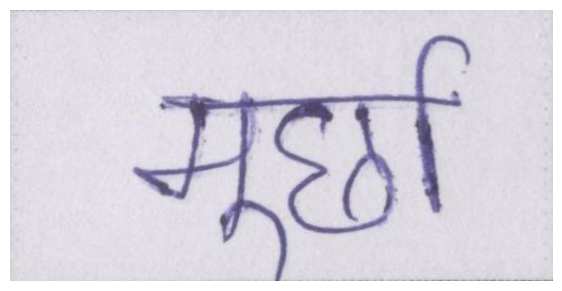

 68%|██████▊   | 68/100 [00:16<00:08,  3.89it/s]


[True]: गुजारिश
[Pred]: गुरामदिर


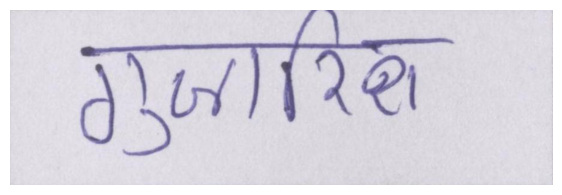

 69%|██████▉   | 69/100 [00:16<00:07,  3.97it/s]


[True]: कम्युनिस्ट
[Pred]: सुक्रामक


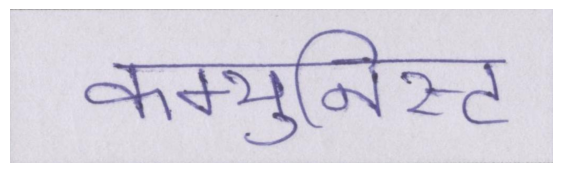

 70%|███████   | 70/100 [00:16<00:07,  4.02it/s]


[True]: अचानक
[Pred]: कालक


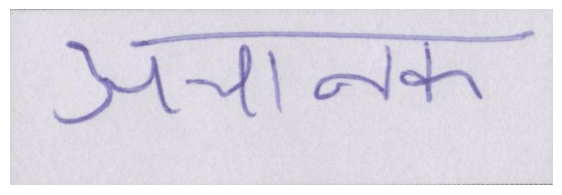

 71%|███████   | 71/100 [00:16<00:06,  4.20it/s]


[True]: सालिक
[Pred]: राजकित


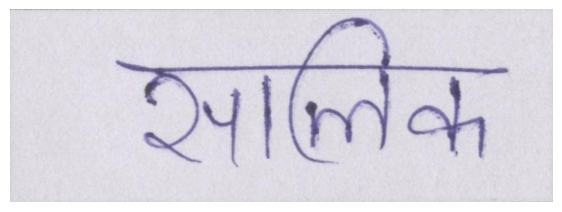

 72%|███████▏  | 72/100 [00:17<00:06,  4.18it/s]


[True]: माथे
[Pred]: मार्थे


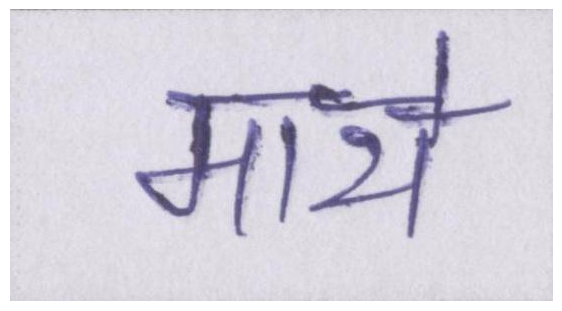

 73%|███████▎  | 73/100 [00:17<00:06,  4.18it/s]


[True]: मुझमें
[Pred]: मुहारों


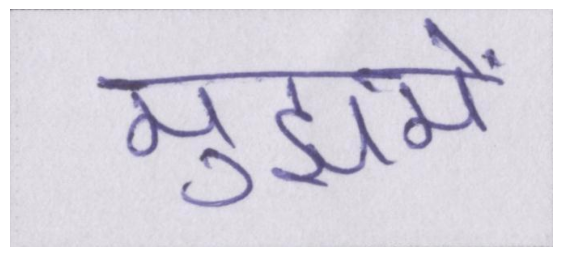

 74%|███████▍  | 74/100 [00:17<00:06,  4.21it/s]


[True]: गोहपारू
[Pred]: साइकोट


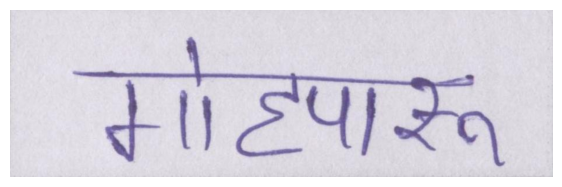

 75%|███████▌  | 75/100 [00:17<00:05,  4.19it/s]


[True]: ठीक-ठाक
[Pred]: ती-ब-ठान


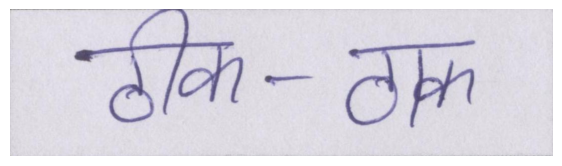

 76%|███████▌  | 76/100 [00:18<00:05,  4.02it/s]


[True]: रहा।
[Pred]: रहा।


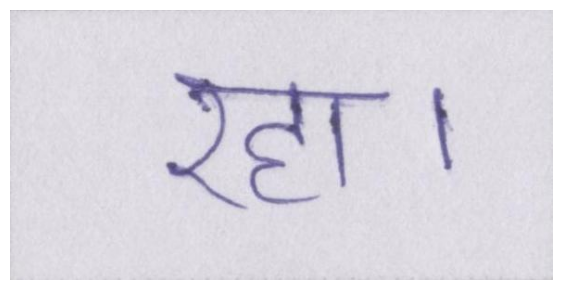

 77%|███████▋  | 77/100 [00:18<00:05,  4.23it/s]


[True]: डाकण
[Pred]: कहाक्ड


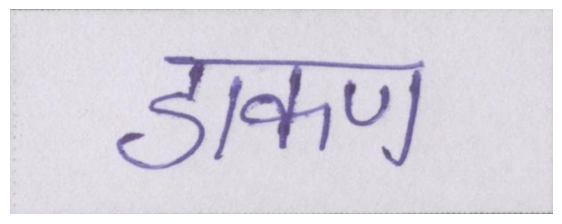

 78%|███████▊  | 78/100 [00:18<00:05,  4.28it/s]


[True]: की।
[Pred]: की।


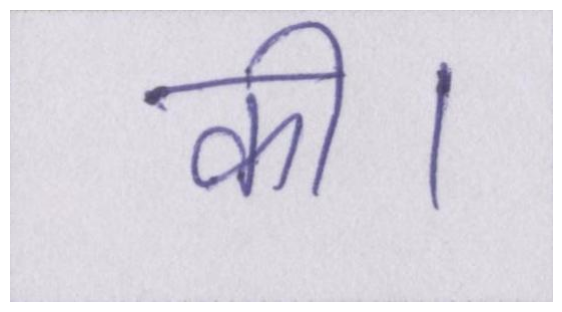

 79%|███████▉  | 79/100 [00:18<00:04,  4.37it/s]


[True]: क्रोंच
[Pred]: पैक्न


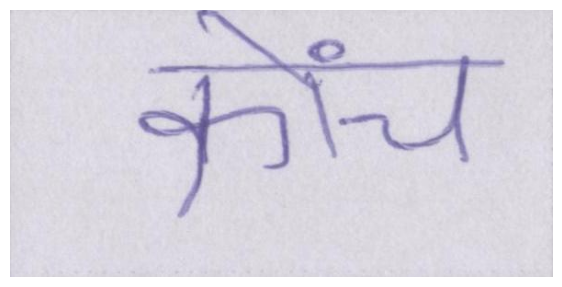

 80%|████████  | 80/100 [00:19<00:04,  4.43it/s]


[True]: छूट।
[Pred]: छूट।


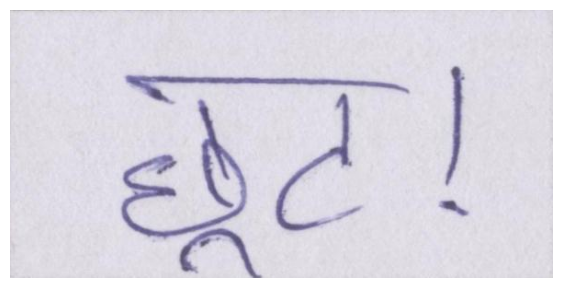

 81%|████████  | 81/100 [00:19<00:04,  4.38it/s]


[True]: अजूबा
[Pred]: अनूदा


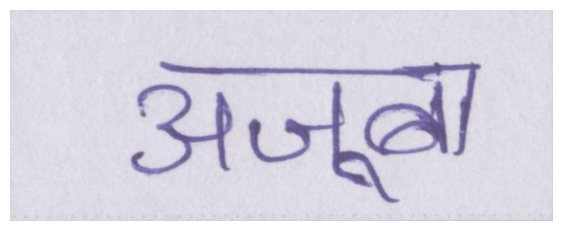

 82%|████████▏ | 82/100 [00:19<00:04,  4.40it/s]


[True]: तहलियानी
[Pred]: खरीलवाली


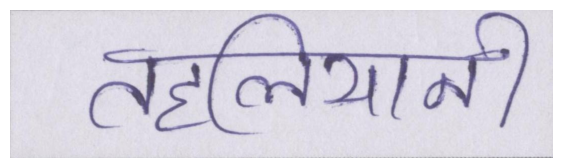

 83%|████████▎ | 83/100 [00:19<00:03,  4.28it/s]


[True]: एंबुलेंस
[Pred]: शॉर्म्युल


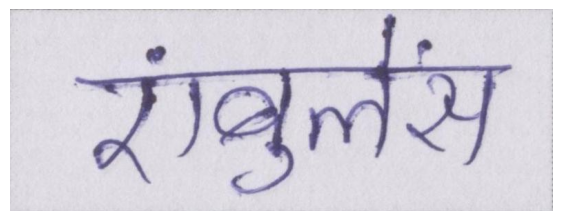

 84%|████████▍ | 84/100 [00:20<00:03,  4.04it/s]


[True]: जनाजा
[Pred]: जानना


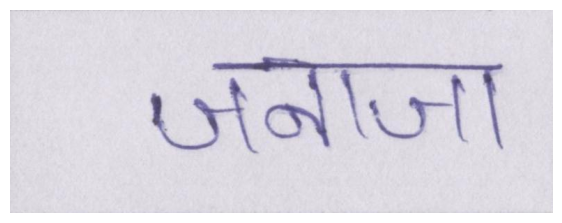

 85%|████████▌ | 85/100 [00:20<00:03,  4.06it/s]


[True]: सम्यग्दर्शन
[Pred]: सरूसरासर


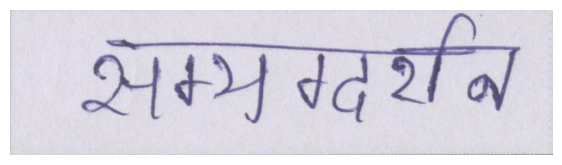

 86%|████████▌ | 86/100 [00:20<00:03,  4.18it/s]


[True]: समयबद्ध
[Pred]: अवस्थाद


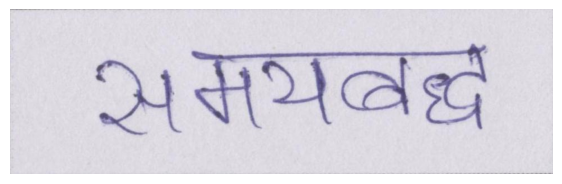

 87%|████████▋ | 87/100 [00:20<00:03,  4.19it/s]


[True]: शामों
[Pred]: माओं


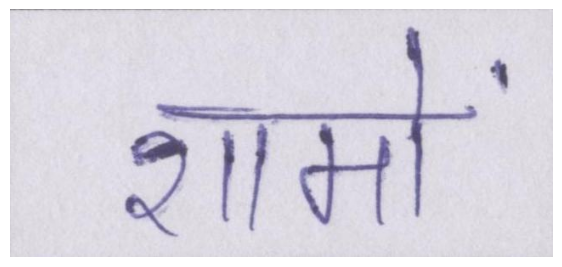

 88%|████████▊ | 88/100 [00:20<00:02,  4.18it/s]


[True]: जवाबदेह
[Pred]: बास्इकेहाद


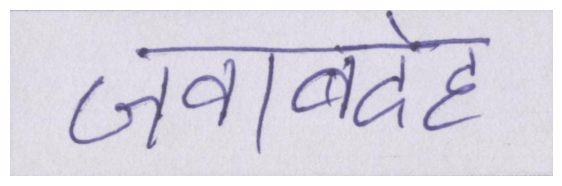

 89%|████████▉ | 89/100 [00:21<00:02,  3.91it/s]


[True]: पढ़ेगा।
[Pred]: पड़ेगा।


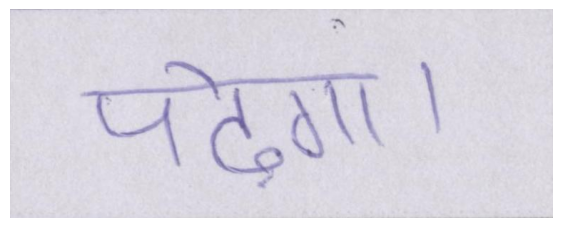

 90%|█████████ | 90/100 [00:21<00:02,  4.03it/s]


[True]: मच
[Pred]: पश्च


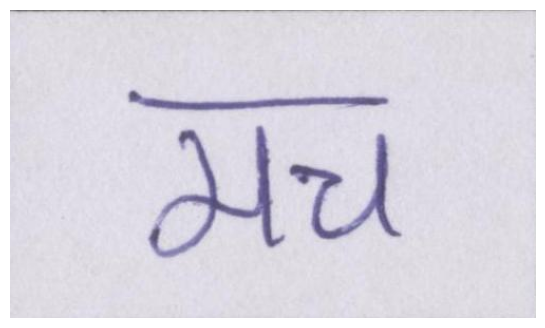

 91%|█████████ | 91/100 [00:21<00:02,  4.28it/s]


[True]: अकड
[Pred]: अक्ड़


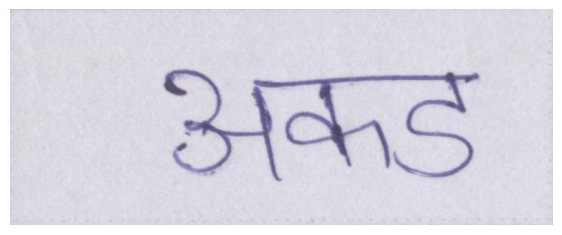

 92%|█████████▏| 92/100 [00:21<00:01,  4.55it/s]


[True]: करैंसी
[Pred]: कैसैसी


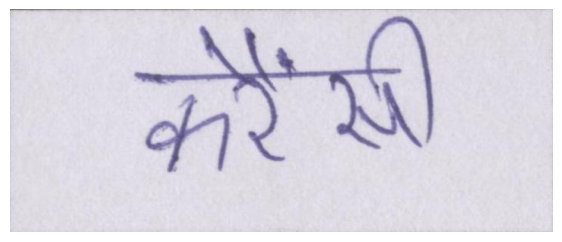

 93%|█████████▎| 93/100 [00:22<00:01,  4.48it/s]


[True]: गुमनाम
[Pred]: गुलबहार


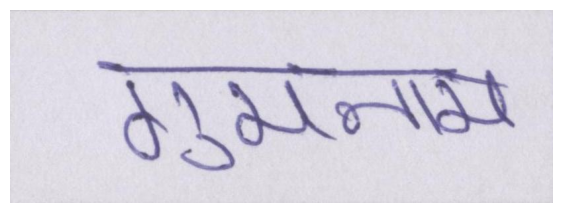

 94%|█████████▍| 94/100 [00:22<00:01,  4.45it/s]


[True]: निचोड़
[Pred]: नीर्ज़ने


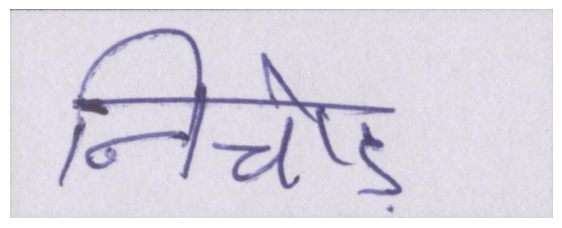

 95%|█████████▌| 95/100 [00:22<00:01,  4.31it/s]


[True]: छुईपाली
[Pred]: हुल्याली


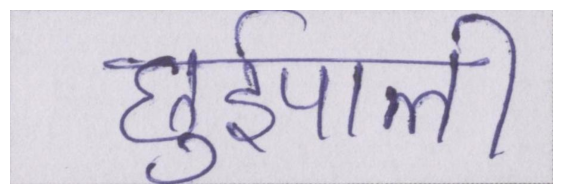

 96%|█████████▌| 96/100 [00:22<00:00,  4.17it/s]


[True]: उत्प्रेक्षा
[Pred]: इक्रेश्या


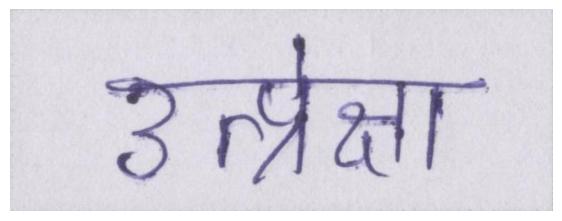

 97%|█████████▋| 97/100 [00:23<00:00,  4.00it/s]


[True]: अबसार
[Pred]: अर्थशार


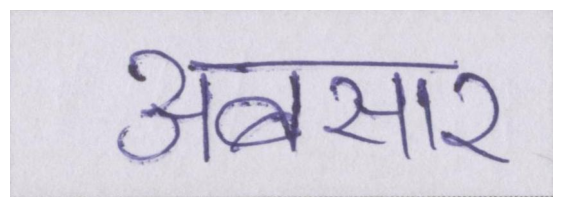

 98%|█████████▊| 98/100 [00:23<00:00,  4.15it/s]


[True]: वार्ता
[Pred]: तार्तां


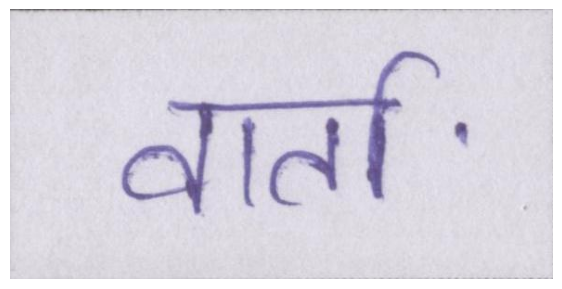

 99%|█████████▉| 99/100 [00:23<00:00,  4.14it/s]


[True]: कन्धों
[Pred]: कहाने


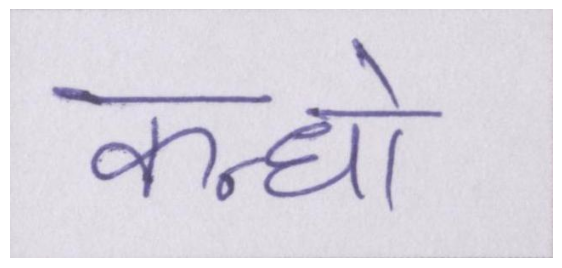

100%|██████████| 100/100 [00:23<00:00,  4.20it/s]


📊 --- Final Evaluation Report ---
Total Samples Processed: 100
Character Error Rate (CER): 0.7180
Word Error Rate (WER):      0.9100


In [180]:
eval_new_data_with_df(test_df_sampled, num_samples=100)

In [ ]:
# For emergency model reload (if saved)
# model.save_pretrained("model/")

In [ ]:
# eval_new_data(
#     data_path=os.path.join(root_dir, 'HindiSeg', '**','*.jpg'),
#     num_samples=5
# )

In [ ]:
# eval_new_data_version_2(
#     data_path=os.path.join(root_dir, 'HindiSeg', '**','*.jpg'),
#     num_samples=5
# )

In [ ]:
!zip -r final_model_output.zip /kaggle/working/model/